# Examen segundo parcial

Alumno: García King Ricardo Neftaly

Aplicando las técnicas de segmentación de imágenes y medición de distancia entre pixeles vistas en clase, desarrolle un programa que permita conocer de manera automática la longitud en pixeles de punta a punta (en la dirección marcada por las líneas amarilla) de los objetos dos y cuatro.Considere los siguiente:

  1.   Del algoritmo que se proponga para segmentar los objetos se deben mostrar las imágenes resultado de cada proceso.
  2.   Imprimir el valor de las coordenadas encontradas como puntos de medición, recalcando que estas deben ser obtenidas como resultado del procesoautomático de segmentación.
  3.   En la imagen original marcar una línea entre los dos puntos de medición e imprima el valor de la longitud.

In [309]:
%reset
# librerias 
from google.colab.patches import cv2_imshow
from PIL import Image
import numpy as np
import cv2 as cv
import urllib
import matplotlib.pyplot as plt

# Sección de variables para ajustar
# Watershed
cantidad_gaussiano = 11
iteraciones = 3

# Canny


Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [310]:
# Lectura de datos
imagen = cv.imread('/content/drive/MyDrive/ESCOM/IA/Vision/Jit1.jpeg')
imagen_copia_watershed = imagen
#cv2_imshow(imagen)

## 1. Segmentación 

Algoritmo Watershed


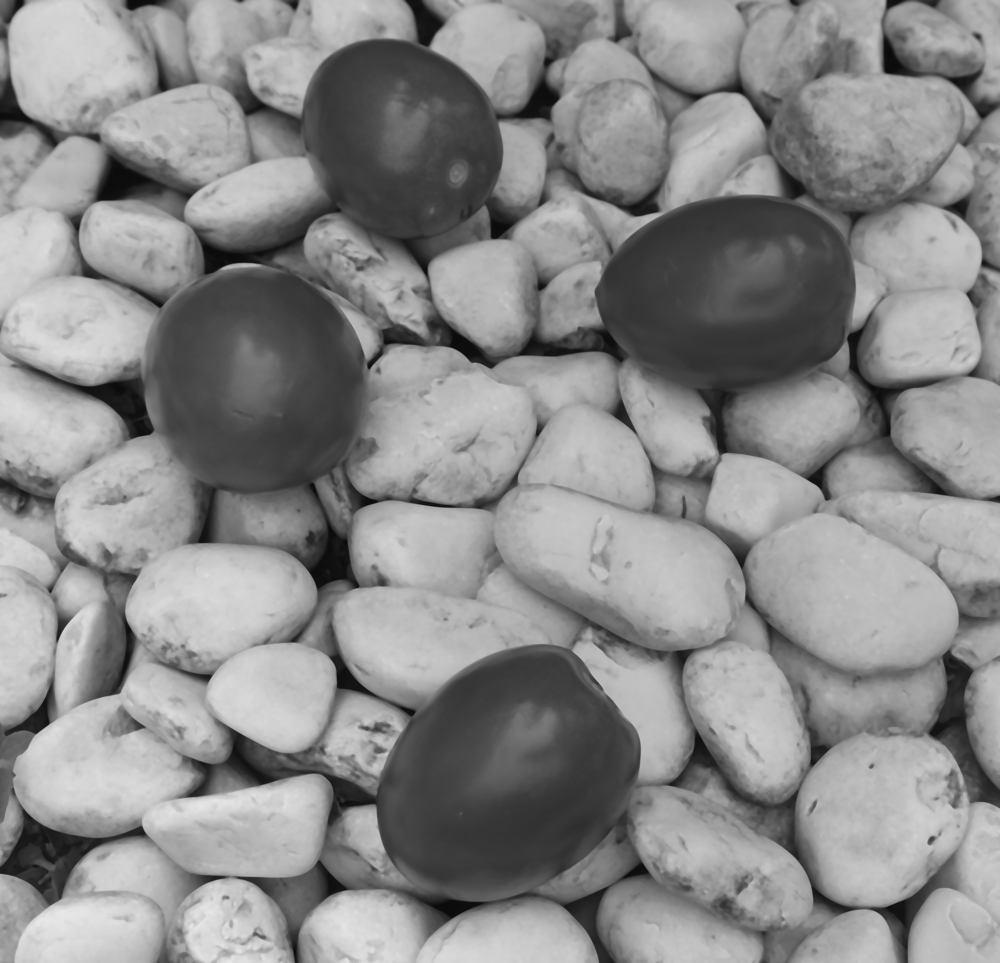

In [311]:
# Suavizado de imagen aún a color
imagen_gaussian = cv.medianBlur(imagen, cantidad_gaussiano)                                     

# Conversión a escala de grises
imagen_bw = cv.cvtColor(imagen_gaussian, cv.COLOR_BGR2GRAY)                     # Imagen a escala de grises

cv2_imshow(imagen_bw)

### Aplicacion de umbral para diferenciar el fondo con Inversión binaria + Otsu

Inversión binaria = invertir el threshold Otsu para selección de jitomates

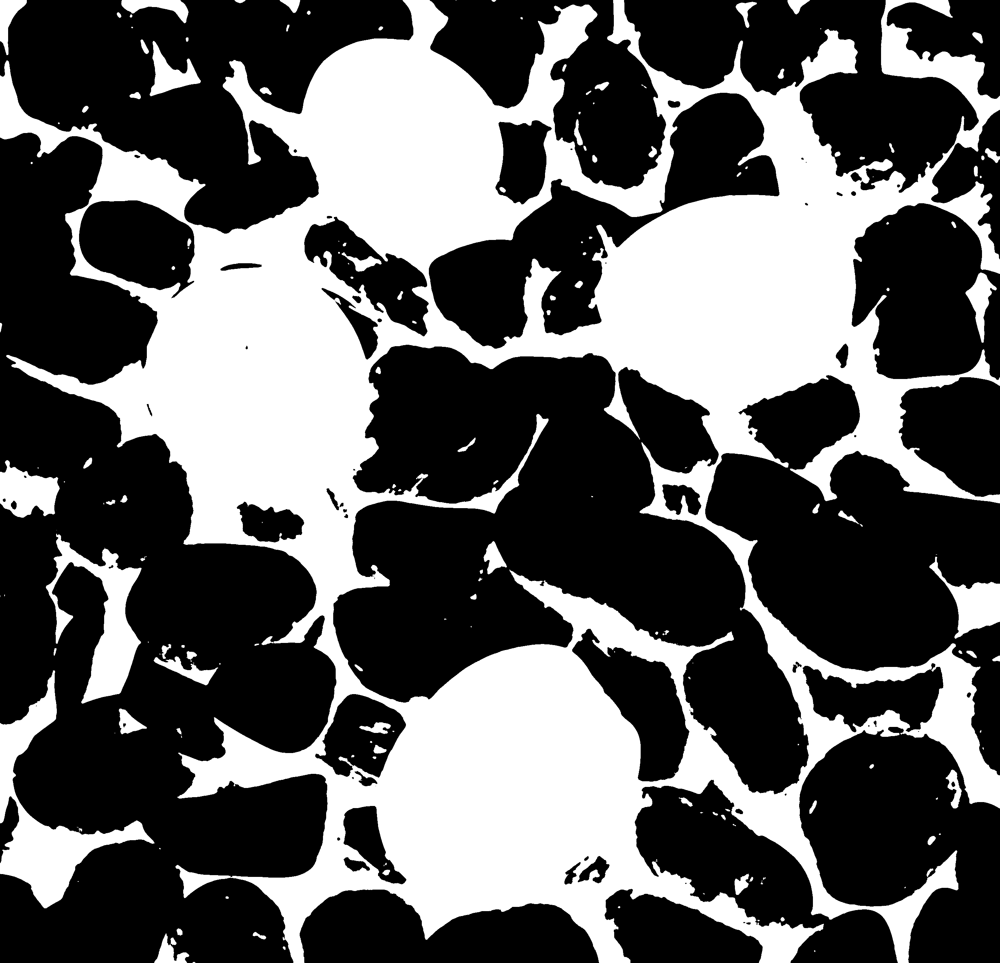

In [318]:
ret, imagen_umbral = cv.threshold(imagen_bw,200,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU) 
#plt.imshow(imagen_umbral, cmap="gray")
cv2_imshow(imagen_umbral)

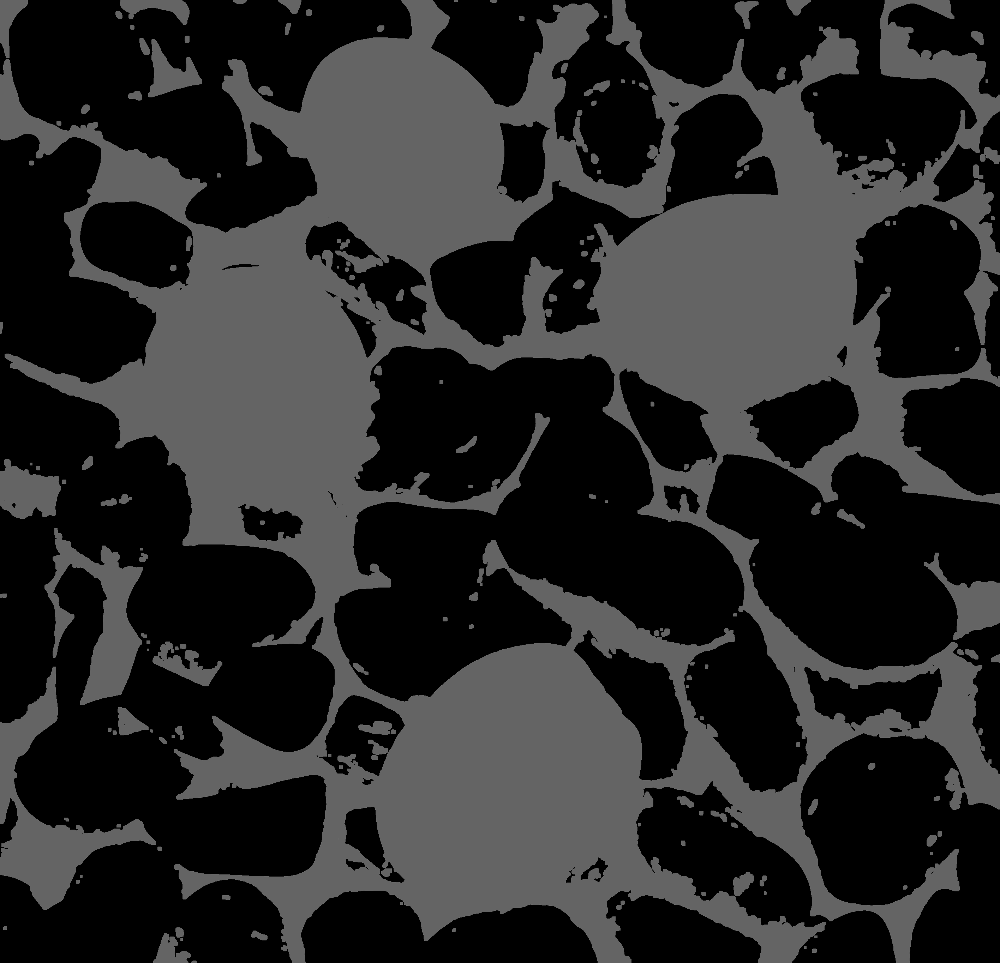

In [305]:
imagen_fondo = cv.dilate(imagen_umbral, kernel=None,iterations=iteraciones)

cv2_imshow(imagen_fondo)

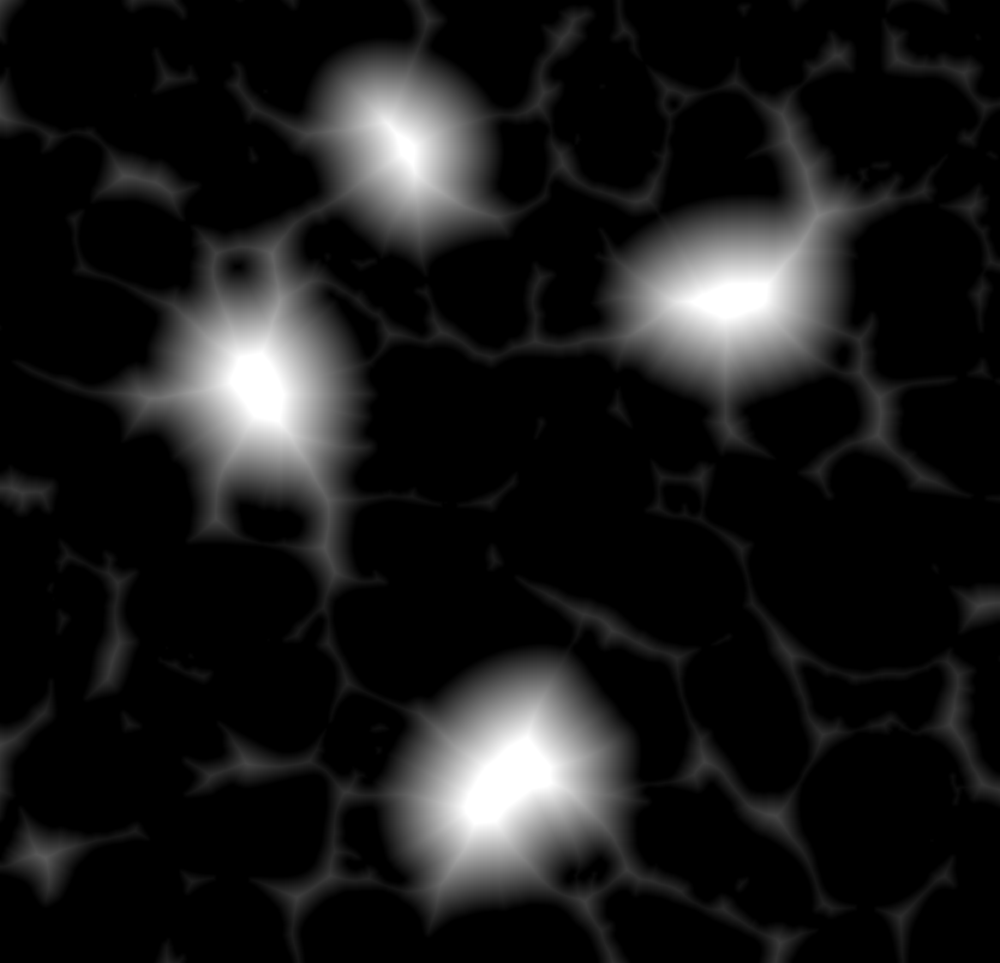

In [296]:
distancia_transform = cv.distanceTransform(imagen_fondo, cv.DIST_L2,5)
ret, no_fondo = cv.threshold(distancia_transform,0.7*distancia_transform.max(),255,0)
ret, no_fondo = cv.threshold(distancia_transform,0.7*distancia_transform.max(),255,0)
cv2_imshow(distancia_transform)

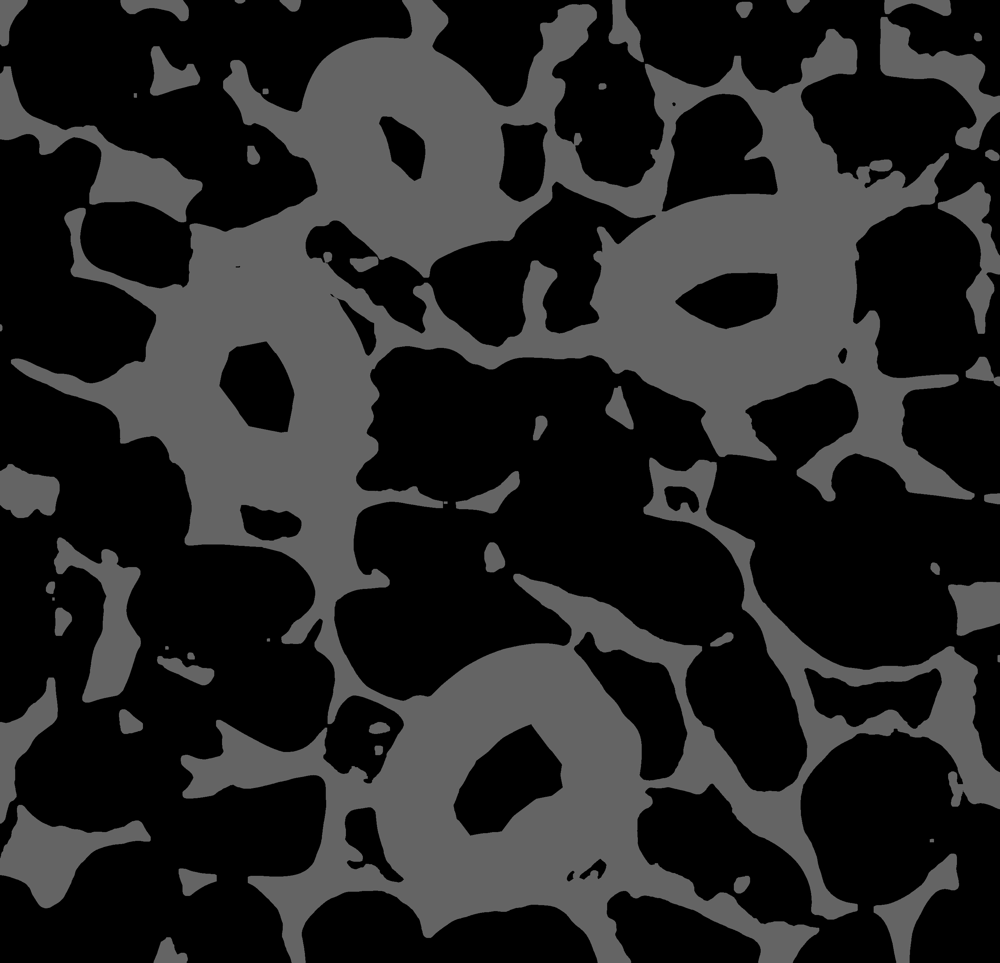

In [297]:
no_fondo = np.uint8(no_fondo)
region_desconocida = cv.subtract(imagen_fondo,no_fondo)
cv2_imshow(region_desconocida)

In [298]:
ret, marcadores = cv.connectedComponents(no_fondo)
# Marcamos los fondos con 1
marcadores = marcadores+1
# Marcamos las regiones deconocidas con 0
marcadores[region_desconocida==255] = 0

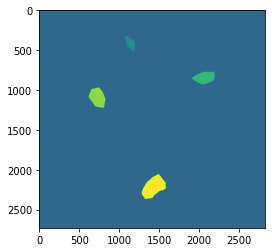

In [299]:
imagen_watershed = cv.watershed(imagen_gaussian, marcadores)
imagen_copia_watershed[imagen_watershed == -1] = [255, 0, 0]
plt.imshow(imagen_watershed)

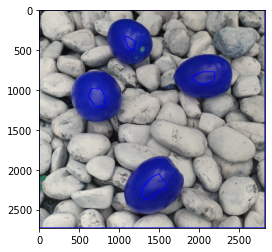

In [289]:
#Por último le podemos dibujar el contorno para diferenciarlo claramente en la imagen inicial
contornos, jerarquía = cv.findContours(marcadores.copy(), cv.RETR_CCOMP, cv.CHAIN_APPROX_SIMPLE)

for i in range(len(contornos)):
    if jerarquía[0][i][3] == -1:
        cv.drawContours(imagen, contornos, i, (0, 0, 255), 10)

plt.imshow(imagen)

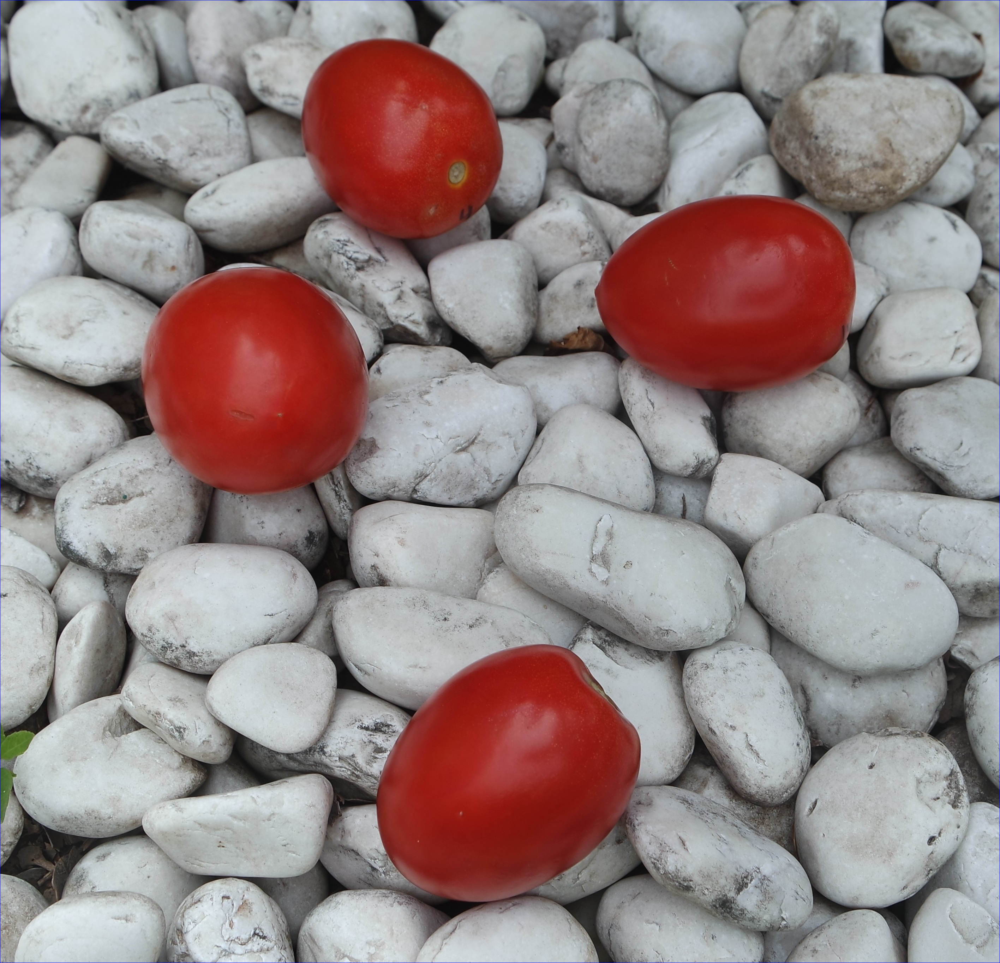

In [300]:
#cv.imwrite('/content/drive/MyDrive/ESCOM/IA/Vision/imagen_watershed.png', imagen)
cv2_imshow(imagen_copia_watershed)

## 2. Detector de bordes

Algoritmo Canny

In [167]:
features = dict(
    maxCorners = 500,
    qualityLevel = 0.2,
    minDistance = 15,
    blockSize = 9
)